In [1]:
from datasets import load_dataset

# Load all three splits with streaming (no cache written to disk)
ds_train = load_dataset(
    "MITLL/LADI-v2-dataset",
    "v2a_resized",
    revision="script",
    data_dir="./Dataset/ladi_dataset",
    base_dir="./Dataset/ladi_dataset",
    trust_remote_code=True,
    streaming=True,
    split="train"
)

ds_val = load_dataset(
    "MITLL/LADI-v2-dataset",
    "v2a_resized",
    revision="script",
    data_dir="./Dataset/ladi_dataset",
    base_dir="./Dataset/ladi_dataset",
    trust_remote_code=True,
    streaming=True,
    split="validation"
)

ds_test = load_dataset(
    "MITLL/LADI-v2-dataset",
    "v2a_resized",
    revision="script",
    data_dir="./Dataset/ladi_dataset",
    base_dir="./Dataset/ladi_dataset",
    trust_remote_code=True,
    streaming=True,
    split="test"
)

print("Train:", ds_train)
print("Val:", ds_val)
print("Test:", ds_test)

Train: IterableDataset({
    features: ['image', 'bridges_any', 'buildings_any', 'buildings_affected_or_greater', 'buildings_minor_or_greater', 'debris_any', 'flooding_any', 'flooding_structures', 'roads_any', 'roads_damage', 'trees_any', 'trees_damage', 'water_any'],
    num_shards: 8030
})
Val: IterableDataset({
    features: ['image', 'bridges_any', 'buildings_any', 'buildings_affected_or_greater', 'buildings_minor_or_greater', 'debris_any', 'flooding_any', 'flooding_structures', 'roads_any', 'roads_damage', 'trees_any', 'trees_damage', 'water_any'],
    num_shards: 893
})
Test: IterableDataset({
    features: ['image', 'bridges_any', 'buildings_any', 'buildings_affected_or_greater', 'buildings_minor_or_greater', 'debris_any', 'flooding_any', 'flooding_structures', 'roads_any', 'roads_damage', 'trees_any', 'trees_damage', 'water_any'],
    num_shards: 1163
})


In [3]:
train_count = 8030
val_count   = 893
test_count  = 1163

print(f"Train: {train_count}")
print(f"Val:   {val_count}")
print(f"Test:  {test_count}")

Train: 8030
Val:   893
Test:  1163


In [4]:
import pandas as pd

# Point to your CSV files
csv_train = "./Dataset/ladi_dataset/v2/ladi_v2a_labels_train_resized.csv"
csv_val   = "./Dataset/ladi_dataset/v2/ladi_v2a_labels_val_resized.csv"
csv_test  = "./Dataset/ladi_dataset/v2/ladi_v2a_labels_test_resized.csv"

# Read CSVs
df_train = pd.read_csv(csv_train)
df_val   = pd.read_csv(csv_val)
df_test  = pd.read_csv(csv_test)

# Get the column names (these are the disaster types)
# The CSV has columns like: 'image_name', 'bridges_any', 'buildings_any', ...
label_columns = [col for col in df_train.columns if col != 'image_name']

print("Class balance (positive counts):")
print(f"{'Class':<25} {'Train':>10} {'Val':>10} {'Test':>10}")
print("-" * 50)

for col in label_columns:
    train_pos = df_train[col].sum()
    val_pos   = df_val[col].sum()
    test_pos  = df_test[col].sum()
    print(f"{col:<25} {train_pos:>10} {val_pos:>10} {test_pos:>10}")

Class balance (positive counts):
Class                          Train        Val       Test
--------------------------------------------------
url                       https://fema-cap-imagery.s3.amazonaws.com/Images/9213/618232/1_000_1234fe6f10-01e8-40e7-83e9-68f83dbe79a6.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/CAP_-_Hur_Ian_Sept_2022/Source/23-1-3141/A0026b/1_000_06_072.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/3045/291572/DSC_0445_1e3cdca7-455f-4559-afbe-d4dd8484e401.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/9213/618290/0_000_026e6e92a0-97d7-4663-983b-59ee7caeaf44.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/9073/613937/DSC_1121_ffe5d2c5-2602-414e-9c7e-9d788603e344.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/CAP_-_Hur_Ian_Sept_2022/Source/23-1-3472/A0004/1_000_09_079.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/9213/618242/0_000_05bd38596a-794f-47ce-abb8-2aa792895e6c.jpghttps://fema-cap-imagery.s3.amazonaws.com/Images/3043/29161

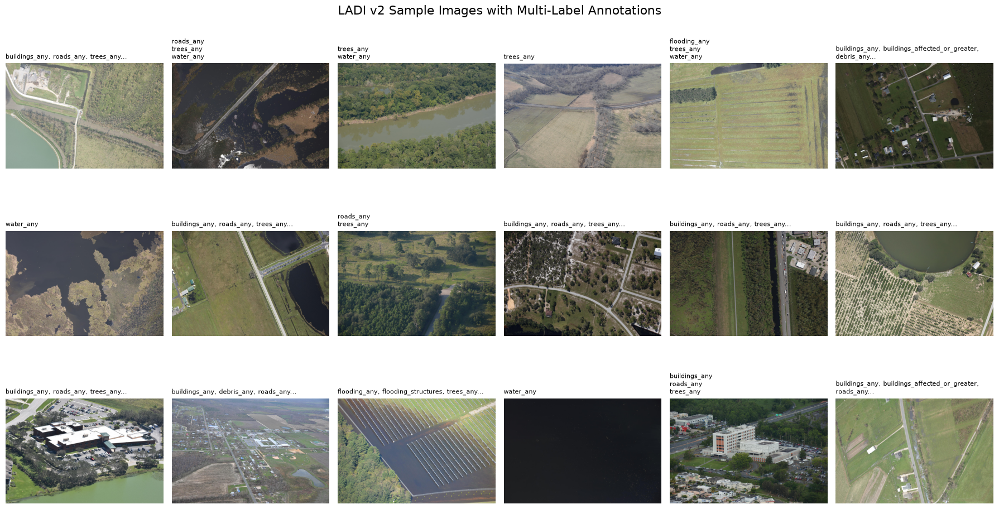

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Use the label columns from your CSV (we defined this earlier)
# If you closed the session, just run this line first: 
# label_columns = [col for col in df_train.columns if col != 'image_name']

# Take 18 random-ish samples (using shuffle with a buffer)
num_samples = 18
shuffled_train = ds_train.shuffle(buffer_size=1000, seed=42)
samples = list(shuffled_train.take(num_samples))

# Setup the plot grid
fig, axes = plt.subplots(3, 6, figsize=(18, 10))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(samples):
        sample = samples[i]
        
        # Get the image
        img = np.array(sample["image"])
        
        # Get the active labels (where value == 1)
        # Note: In streaming mode, sample returns a dict with keys = column names
        active_labels = [name for name in label_columns if sample.get(name, 0) == 1]
        
        # Format the title (show all labels if <= 3, else show first 3 + "...")
        if not active_labels:
            title = "No labels"
        elif len(active_labels) <= 3:
            title = "\n".join(active_labels)
        else:
            title = ", ".join(active_labels[:3]) + "..."
        
        # Display
        ax.imshow(img)
        ax.set_title(title, fontsize=8, loc='left', wrap=True)
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("LADI v2 Sample Images with Multi-Label Annotations", fontsize=16)
plt.tight_layout()
plt.show()

In [7]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

In [8]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
import torch

# MPS detection for Mac Mini M4
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("✅ Using Apple MPS (GPU)")
else:
    device = torch.device("cpu")
    print("⚠️ Using CPU")

# Load model
processor = AutoImageProcessor.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = AutoModelForImageClassification.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = model.to(device)
model.eval()

print(f"Model loaded on {device}")

✅ Using Apple MPS (GPU)


preprocessor_config.json:   0%|          | 0.00/424 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.51k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 94.1MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/153 [00:00<?, ?it/s]

Model loaded on mps


In [12]:
import os
import torch
import numpy as np
from transformers import AutoImageProcessor, AutoModelForImageClassification
from datasets import load_dataset
from tqdm import tqdm
from sklearn.metrics import average_precision_score, f1_score

# 1. Enable MPS fallback
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

# 2. Device
if torch.backends.mps.is_available():
    device = torch.device("cpu")   # Testing CPU – change to "mps" to try MPS again
    print("⚠️ Using CPU")
else:
    device = torch.device("mps")
    print("✅ Using Apple MPS (GPU)")

# 3. Load model and processor
print("Loading model...")
processor = AutoImageProcessor.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = AutoModelForImageClassification.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = model.to(device)
model.eval()
print("Model loaded.")

# 4. Load test split with streaming=True
print("Loading test split (streaming)...")
ds_test = load_dataset(
    "MITLL/LADI-v2-dataset",
    "v2a_resized",
    revision="script",
    data_dir="./Dataset/ladi_dataset",
    base_dir="./Dataset/ladi_dataset",
    trust_remote_code=True,
    streaming=True,
    split="test"
)

# 5. Get class names and number of samples
class_names = list(model.config.id2label.values())
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Get total number of test samples (num_shards equals number of rows)
total_samples = ds_test.num_shards
print(f"Test set size: {total_samples} images")

# 6. Batch generator with progress bar
BATCH_SIZE = 16
total_batches = (total_samples + BATCH_SIZE - 1) // BATCH_SIZE
print(f"Batch size: {BATCH_SIZE} → {total_batches} batches total")

def batch_generator(dataset, batch_size):
    batch_images = []
    batch_labels = []
    for sample in dataset:
        label_vector = [sample.get(name, 0) for name in class_names]
        label_vector = np.array(label_vector, dtype=np.float32)
        batch_images.append(sample["image"])
        batch_labels.append(label_vector)
        if len(batch_images) == batch_size:
            yield batch_images, batch_labels
            batch_images, batch_labels = [], []
    if batch_images:
        yield batch_images, batch_labels

# 7. Run inference with progress bar showing total batches
all_preds = []
all_labels = []

print(f"Running inference on test set...")
for images, labels_batch in tqdm(
    batch_generator(ds_test, BATCH_SIZE),
    total=total_batches,
    desc="Evaluating batches",
    unit="batch"
):
    # Process images
    inputs = processor(images=images, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    
    # Forward pass
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = torch.sigmoid(logits).cpu().numpy()  # shape: (B, 12)
    
    # Convert labels to numpy array
    labels_batch = np.array(labels_batch)  # shape: (B, 12)
    
    all_preds.append(probs)
    all_labels.append(labels_batch)

# Concatenate
all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

print(f"✅ Done! Evaluated {len(all_preds)} images.")

# 8. Compute metrics
per_class_ap = []
for i in range(num_classes):
    ap = average_precision_score(all_labels[:, i], all_preds[:, i])
    per_class_ap.append(ap)
mAP = np.mean(per_class_ap)

per_class_f1 = []
for i in range(num_classes):
    pred_bin = (all_preds[:, i] > 0.5).astype(int)
    f1 = f1_score(all_labels[:, i], pred_bin, zero_division=0)
    per_class_f1.append(f1)
mean_f1 = np.mean(per_class_f1)

print("\n" + "="*60)
print("📊 Baseline Reproduction Results (Mac Mini M4)")
print("="*60)
print(f"Mean Average Precision (mAP): {mAP:.4f}")
print(f"Mean F1 (threshold 0.5):      {mean_f1:.4f}")
print("\nPer-class Average Precision:")
for i, name in enumerate(class_names):
    print(f"  {name:<30}: {per_class_ap[i]:.4f}")

⚠️ Using CPU
Loading model...


Loading weights:   0%|          | 0/153 [00:00<?, ?it/s]

Model loaded.
Loading test split (streaming)...
Number of classes: 12
Test set size: 1163 images
Batch size: 16 → 73 batches total
Running inference on test set...


Evaluating batches:   0%|                            | 0/73 [00:00<?, ?batch/s]/opt/miniconda3/envs/ladi/lib/python3.11/site-packages/datasets/features/image.py:338: UserWarning: Downcasting array dtype int64 to uint8 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
Evaluating batches: 100%|█████████████████| 73/73 [1:23:27<00:00, 68.59s/batch]

✅ Done! Evaluated 1163 images.

📊 Baseline Reproduction Results (Mac Mini M4)
Mean Average Precision (mAP): 0.6115
Mean F1 (threshold 0.5):      0.5869

Per-class Average Precision:
  bridges_any                   : 0.4126
  buildings_any                 : 0.9808
  buildings_affected_or_greater : 0.5864
  buildings_minor_or_greater    : 0.3774
  debris_any                    : 0.5100
  flooding_any                  : 0.5174
  flooding_structures           : 0.3957
  roads_any                     : 0.9711
  roads_damage                  : 0.3272
  trees_any                     : 0.9964
  trees_damage                  : 0.4340
  water_any                     : 0.8293


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import multilabel_confusion_matrix, classification_report
import seaborn as sns

# 1. Confusion matrix per class (multi-label)
threshold = 0.5
pred_binary = (all_preds > threshold).astype(int)

# Calculate TP, FP, FN per class
mcm = multilabel_confusion_matrix(all_labels, pred_binary)

print("="*60)
print("🔍 Per-class Confusion Breakdown")
print("="*60)
for i, name in enumerate(class_names):
    tn, fp, fn, tp = mcm[i].ravel()
    print(f"{name:<30} | TP: {tp:>4} | FP: {fp:>4} | FN: {fn:>4} | TN: {tn:>5}")

# 2. Identify the worst-performing classes (already have AP from Phase 1)
print("\n" + "="*60)
print("📉 Worst Performing Classes (by AP)")
print("="*60)
sorted_idx = np.argsort(per_class_ap)
for idx in sorted_idx[:5]:  # bottom 5
    print(f"  {class_names[idx]:<30}: AP = {per_class_ap[idx]:.4f}")

# 3. Find systematically misclassified samples
#    FN: Model missed a label that was present
#    FP: Model predicted a label that wasn't present
fn_samples = []
fp_samples = []

# We need to map predictions back to dataset indices
# Since we don't have indices in streaming, we'll just iterate through the dataset
# and compare with our predictions array.
# NOTE: This requires re-iterating the test set. Since you just finished, 
# we can either do it now (takes ~1 minute for 1163 images on CPU) or skip.
# Let's do it quickly.

print("\n🔎 Collecting misclassified samples (this will take ~1 minute)...")
test_iter = iter(ds_test)
misclassified_examples = []  # store (image, true_labels, pred_probs, type)

for idx, sample in enumerate(test_iter):
    if idx >= len(all_preds):
        break
    
    true_vec = all_labels[idx]
    pred_vec = all_preds[idx]
    pred_bin = (pred_vec > 0.5).astype(int)
    
    # Check for False Negatives (model missed a present label)
    fn_classes = [class_names[i] for i in range(num_classes) if true_vec[i] == 1 and pred_bin[i] == 0]
    # Check for False Positives (model predicted an absent label)
    fp_classes = [class_names[i] for i in range(num_classes) if true_vec[i] == 0 and pred_bin[i] == 1]
    
    if fn_classes or fp_classes:
        misclassified_examples.append({
            'image': sample['image'],
            'true_labels': [class_names[i] for i in range(num_classes) if true_vec[i] == 1],
            'pred_labels': [class_names[i] for i in range(num_classes) if pred_bin[i] == 1],
            'fn': fn_classes,
            'fp': fp_classes
        })
    
    # Stop after collecting ~100 to keep it manageable
    if len(misclassified_examples) >= 100:
        break

print(f"Collected {len(misclassified_examples)} misclassified samples.")

🔍 Per-class Confusion Breakdown
bridges_any                    | TP:   25 | FP:   24 | FN:   36 | TN:  1078
buildings_any                  | TP:  714 | FP:   26 | FN:  130 | TN:   293
buildings_affected_or_greater  | TP:   31 | FP:   20 | FN:   27 | TN:  1085
buildings_minor_or_greater     | TP:    7 | FP:    6 | FN:   20 | TN:  1130
debris_any                     | TP:   18 | FP:   12 | FN:   19 | TN:  1114
flooding_any                   | TP:   43 | FP:   40 | FN:   48 | TN:  1032
flooding_structures            | TP:    6 | FP:    6 | FN:    8 | TN:  1143
roads_any                      | TP:  803 | FP:   50 | FN:  136 | TN:   174
roads_damage                   | TP:    5 | FP:    5 | FN:   10 | TN:  1143
trees_any                      | TP:  875 | FP:    2 | FN:  215 | TN:    71
trees_damage                   | TP:   34 | FP:   27 | FN:   87 | TN:  1015
water_any                      | TP:  375 | FP:  118 | FN:  181 | TN:   489

📉 Worst Performing Classes (by AP)
  roads_damage      

/opt/miniconda3/envs/ladi/lib/python3.11/site-packages/datasets/features/image.py:338: UserWarning: Downcasting array dtype int64 to uint8 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")


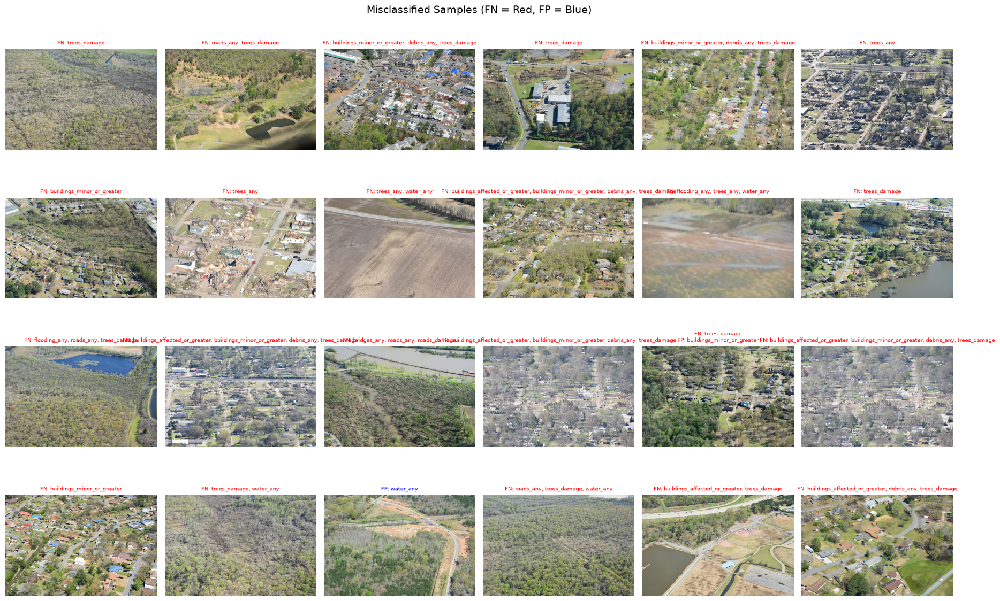

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Take a subset (e.g., 24 samples) for visualization
num_show = min(24, len(misclassified_examples))
if num_show > 0:
    random.shuffle(misclassified_examples)
    samples_to_show = misclassified_examples[:num_show]
    
    fig, axes = plt.subplots(4, 6, figsize=(18, 12))
    axes = axes.flatten()
    
    for i, ax in enumerate(axes):
        if i < len(samples_to_show):
            sample = samples_to_show[i]
            img = np.array(sample['image'])
            
            # Build title: show FN (red) and FP (blue)
            fn_text = f"FN: {', '.join(sample['fn'])}" if sample['fn'] else ""
            fp_text = f"FP: {', '.join(sample['fp'])}" if sample['fp'] else ""
            title = f"{fn_text}\n{fp_text}" if fn_text and fp_text else fn_text or fp_text or "No error"
            
            ax.imshow(img)
            ax.set_title(title, fontsize=7, color='red' if sample['fn'] else 'blue')
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.suptitle("Misclassified Samples (FN = Red, FP = Blue)", fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("No misclassified samples found (unlikely!).")

In [16]:
import os
import torch
import numpy as np
from transformers import AutoImageProcessor, AutoModelForImageClassification
from datasets import load_dataset
from tqdm import tqdm
from sklearn.metrics import average_precision_score

# 1. Device (stick to CPU for stability, as you did for test)
device = torch.device("cpu")
print(f"⚠️ Using CPU for validation (will take ~1 hour)")

# 2. Load model (it will load from cache, so it's instant)
print("Loading model...")
processor = AutoImageProcessor.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = AutoModelForImageClassification.from_pretrained("MITLL/LADI-v2-classifier-small-reference")
model = model.to(device)
model.eval()
print("Model loaded.")

# 3. Load VALIDATION split (streaming)
print("Loading validation split (streaming)...")
ds_val = load_dataset(
    "MITLL/LADI-v2-dataset",
    "v2a_resized",
    revision="script",
    data_dir="./Dataset/ladi_dataset",
    base_dir="./Dataset/ladi_dataset",
    trust_remote_code=True,
    streaming=True,
    split="validation"
)

# 4. Get class names and total samples
class_names = list(model.config.id2label.values())
num_classes = len(class_names)
total_samples = ds_val.num_shards
print(f"Validation set size: {total_samples} images")

# 5. Batch generator
BATCH_SIZE = 16
total_batches = (total_samples + BATCH_SIZE - 1) // BATCH_SIZE
print(f"Batch size: {BATCH_SIZE} → {total_batches} batches total")

def batch_generator(dataset, batch_size):
    batch_images = []
    batch_labels = []
    for sample in dataset:
        label_vector = [sample.get(name, 0) for name in class_names]
        label_vector = np.array(label_vector, dtype=np.float32)
        batch_images.append(sample["image"])
        batch_labels.append(label_vector)
        if len(batch_images) == batch_size:
            yield batch_images, batch_labels
            batch_images, batch_labels = [], []
    if batch_images:
        yield batch_images, batch_labels

# 6. Run inference
all_preds = []
all_labels = []

print(f"Running inference on validation set...")
for images, labels_batch in tqdm(
    batch_generator(ds_val, BATCH_SIZE),
    total=total_batches,
    desc="Evaluating validation batches",
    unit="batch"
):
    inputs = processor(images=images, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = torch.sigmoid(logits).cpu().numpy()
    
    labels_batch = np.array(labels_batch)
    all_preds.append(probs)
    all_labels.append(labels_batch)

all_preds = np.concatenate(all_preds, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

print(f"✅ Done! Evaluated {len(all_preds)} images.")

# 7. Compute validation mAP
per_class_ap = []
for i in range(num_classes):
    ap = average_precision_score(all_labels[:, i], all_preds[:, i])
    per_class_ap.append(ap)
val_mAP = np.mean(per_class_ap)

print("\n" + "="*60)
print("📊 Validation Set Results")
print("="*60)
print(f"Validation mAP: {val_mAP:.4f}")
print(f"Test mAP (from your earlier run): 0.6115")
print(f"Distribution Shift Gap: {val_mAP - 0.6115:.4f}")

⚠️ Using CPU for validation (will take ~1 hour)
Loading model...


Loading weights:   0%|          | 0/153 [00:00<?, ?it/s]

Model loaded.
Loading validation split (streaming)...
Validation set size: 893 images
Batch size: 16 → 56 batches total
Running inference on validation set...


Evaluating validation batches:   0%|                 | 0/56 [00:00<?, ?batch/s]/opt/miniconda3/envs/ladi/lib/python3.11/site-packages/datasets/features/image.py:338: UserWarning: Downcasting array dtype int64 to uint8 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
Evaluating validation batches: 100%|██████| 56/56 [1:01:45<00:00, 66.17s/batch]

✅ Done! Evaluated 893 images.

📊 Validation Set Results
Validation mAP: 0.8113
Test mAP (from your earlier run): 0.6115
Distribution Shift Gap: 0.1998


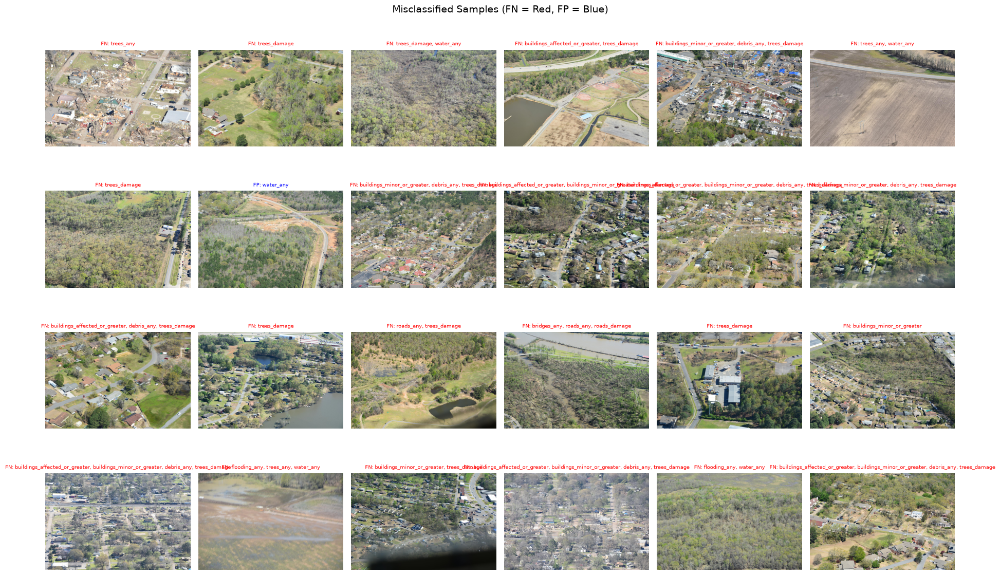

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Take a subset (e.g., 24 samples) for visualization
num_show = min(24, len(misclassified_examples))
if num_show > 0:
    random.shuffle(misclassified_examples)
    samples_to_show = misclassified_examples[:num_show]
    
    fig, axes = plt.subplots(4, 6, figsize=(18, 12))
    axes = axes.flatten()
    
    for i, ax in enumerate(axes):
        if i < len(samples_to_show):
            sample = samples_to_show[i]
            img = np.array(sample['image'])
            
            # Build title: show FN (red) and FP (blue)
            fn_text = f"FN: {', '.join(sample['fn'])}" if sample['fn'] else ""
            fp_text = f"FP: {', '.join(sample['fp'])}" if sample['fp'] else ""
            title = f"{fn_text}\n{fp_text}" if fn_text and fp_text else fn_text or fp_text or "No error"
            
            ax.imshow(img)
            ax.set_title(title, fontsize=7, color='red' if sample['fn'] else 'blue')
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.suptitle("Misclassified Samples (FN = Red, FP = Blue)", fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("No misclassified samples found (unlikely!).")